<a href="https://colab.research.google.com/github/MrTMokoena/Movie-Correlation/blob/main/Movie_Correlation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing Requirements

In [45]:
# Importing Required Libraries:

import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib
import matplotlib.pyplot as plt

plt.style.use('ggplot') # setting the visual style for the plot(s) created from 'matplotlib', the 'ggplot' style will provide a visually appealing theme with specific colors; fonts; gridlines; etc

from matplotlib.pyplot import figure

%matplotlib inline
# ensuring that the plots generated are displayed below the cell code that produced it/them itherwise plots will be displayed in other windows or even not displayed at all in our enviroment

matplotlib.rcParams['figure.figsize'] = (12,8) # specificied the parameter within the matplotlib to make representations a default size

In [46]:
# Improrting Data:

df = pd.read_csv ('/content/movies.csv')

In [47]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


# Cleaning The Data

In [48]:
df.isnull().sum()

,0
name,0
rating,77
genre,0
year,0
released,2
score,3
votes,3
director,0
writer,3
star,1


In [49]:
# Checking for missing values in each column of our DataFrame, calculates the percentage of missing values for each column and then prints the column name and the calculated percentage

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


In [50]:
df.duplicated().sum()

np.int64(0)

In [51]:
# The columns 'budget' & 'gross' contain numeric values (they probabaly have outliers) therefore...

# Imputing missing values in 'budget' and 'gross' with the median
df['budget'].fillna(df['budget'].median(), inplace=True)
df['gross'].fillna(df['gross'].median(), inplace=True)

# Drop rows with missing values in other columns
# df.dropna(subset=['rating', 'released', 'score', 'votes', 'writer', 'star', 'country', 'company', 'runtime'], inplace=True)

# Verifing that the columns ('gross' & 'budget') have no more missing values in these columns
print(df.isnull().sum())

name         0
rating      77
genre        0
year         0
released     2
score        3
votes        3
director     0
writer       3
star         1
country      3
budget       0
gross        0
company     17
runtime      4
dtype: int64


/tmp/ipython-input-1776633255.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['budget'].fillna(df['budget'].median(), inplace=True)
/tmp/ipython-input-1776633255.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)'

In [52]:
df.dtypes

,0
name,object
rating,object
genre,object
year,int64
released,object
score,float64
votes,float64
director,object
writer,object
star,object


In [53]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [55]:
df['correct_release_month'] = df['released'].astype(str).str[:4]

df = df.rename(columns={'year':'correct_release_year'})

df['budget'] = df['budget'].astype('int64')

df['gross'] = df['gross'].astype('int64')

df.head()

,name,rating,genre,correct_release_year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correct_release_month
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,June
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,July
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,June
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,July
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,July


In [57]:
df.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,correct_release_year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correct_release_month
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,Dece
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,Apri
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,Dece
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,Dece
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,Apri
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3818,"Love, Honor and Obey",R,Comedy,2000,"February 9, 2001 (United States)",6.5,5200.0,Dominic Anciano,Dominic Anciano,Sadie Frost,United Kingdom,20500000,1400,British Broadcasting Corporation (BBC),103.0,Febr
7625,The Untold Story,NaN,Comedy,2019,"January 11, 2019 (United States)",5.7,320.0,Shane Stanley,Lee Stanley,Miko Hughes,United States,20500000,790,Visual Arts Entertainment,104.0,Janu
7580,Run with the Hunted,Not Rated,Crime,2019,"June 26, 2020 (United States)",5.2,735.0,John Swab,John Swab,Ron Perlman,United States,20500000,682,Roxwell Films,93.0,June
2417,Madadayo,NaN,Drama,1993,"April 17, 1993 (Japan)",7.3,5100.0,Akira Kurosawa,Ishirô Honda,Tatsuo Matsumura,Japan,11900000,596,DENTSU Music And Entertainment,134.0,Apri


In [59]:
# Setting to display/show all the rows in the dataframe

pd.set_option('display.max_rows', None)

In [60]:
df.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,correct_release_year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correct_release_month
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,Dece
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,Apri
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,Dece
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,Dece
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,Apri
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0,July
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0,June
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0,May
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0,Apri
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0,Nove


# Plotting The Dataset

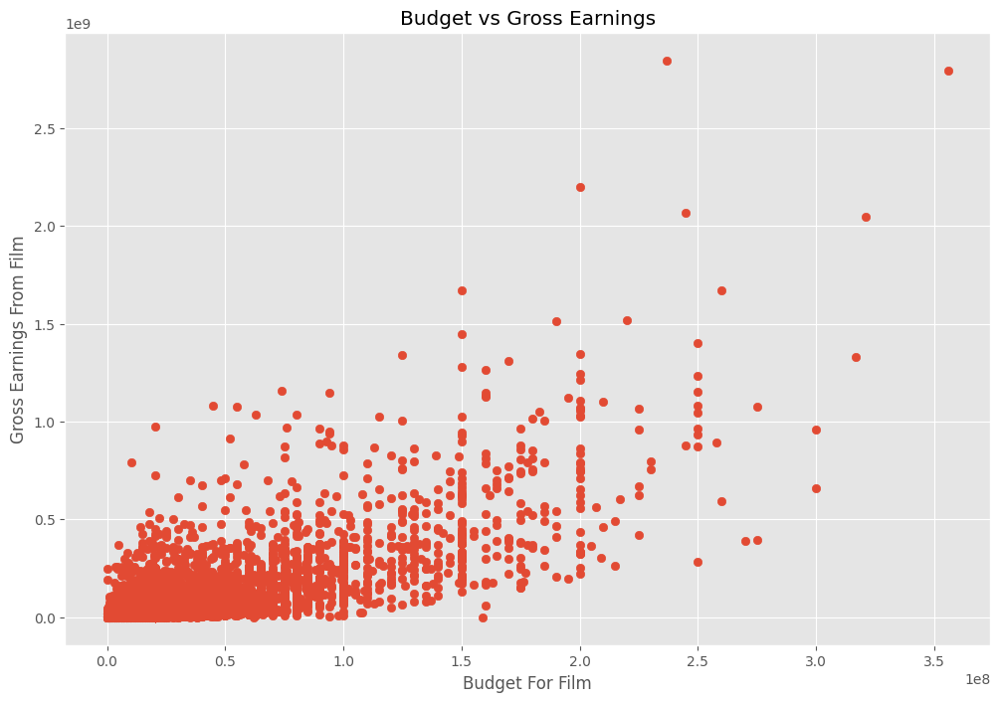

In [63]:
plt.scatter(x=df['budget'], y=df['gross'])
plt.title('Budget vs Gross Earnings')
plt.xlabel('Budget For Film')
plt.ylabel('Gross Earnings From Film')
plt.show()

# The value 3.5 on the x-axis actually represents 3.5 * 10^8, which is 350,000,000 (three hundred and fifty million)

<Axes: xlabel='budget', ylabel='gross'>

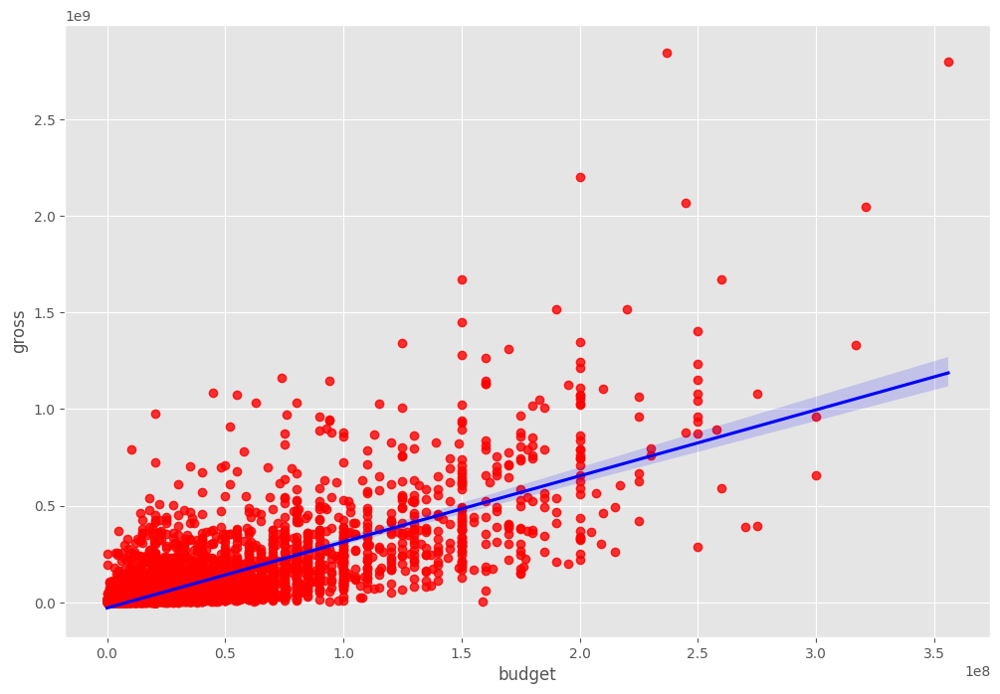

In [66]:
sns.regplot(x='budget', y='gross', data=df, scatter_kws={"color": "red"}, line_kws={"color":"blue"})

In [67]:
# Trying to calculate the correlation between all columns, including the 'name' column which contains strings ('The Shining' is one example).

df.corr()

# But Correlation can only be calculated between numerical data types.

ValueError: could not convert string to float: 'The Shining'

In [70]:
# Calculating the correlation matrix for only the numerical columns
correlation_matrix = df.select_dtypes(include=np.number).corr()

In [71]:
# Displaying to look at the correlation

display(correlation_matrix)

,correct_release_year,score,votes,budget,gross,runtime
correct_release_year,1.000000,0.097995,0.222945,0.291690,0.259504,0.120811
score,0.097995,1.000000,0.409182,0.061979,0.185583,0.399451
votes,0.222945,0.409182,1.000000,0.460932,0.632103,0.309212
budget,0.291690,0.061979,0.460932,1.000000,0.745881,0.273363
gross,0.259504,0.185583,0.632103,0.745881,1.000000,0.244360
runtime,0.120811,0.399451,0.309212,0.273363,0.244360,1.000000


There are several ways to measure correlation, depending on the type of data you have and the relationship you want to explore. Here are some of the most common types:

- **Pearson Correlation Coefficient:** This is the most widely used type of correlation. It measures the linear relationship between two continuous variables. The Pearson correlation coefficient ranges from -1 to +1, where:
+1 indicates a perfect positive linear correlation (as one variable increases, the other increases proportionally).
-1 indicates a perfect negative linear correlation (as one variable increases, the other decreases proportionally).
0 indicates no linear correlation.
The correlation matrix you generated using df.select_dtypes(include=np.number).corr() likely calculated the Pearson correlation coefficient by default, as it's the standard for numerical data.

- **Spearman Rank Correlation Coefficient:** This type of correlation assesses the monotonic relationship between two variables. It's based on the ranks of the data rather than the actual values. This is useful when the relationship between variables is not strictly linear but still tends in a consistent direction. It's also less sensitive to outliers than Pearson correlation.

- **Kendall Rank Correlation Coefficient (Kendall's Tau):** Similar to Spearman correlation, Kendall's Tau also measures the strength of dependence between two variables based on their ranks. It's often used for non-parametric data and is particularly useful for assessing the agreement between two rankings.

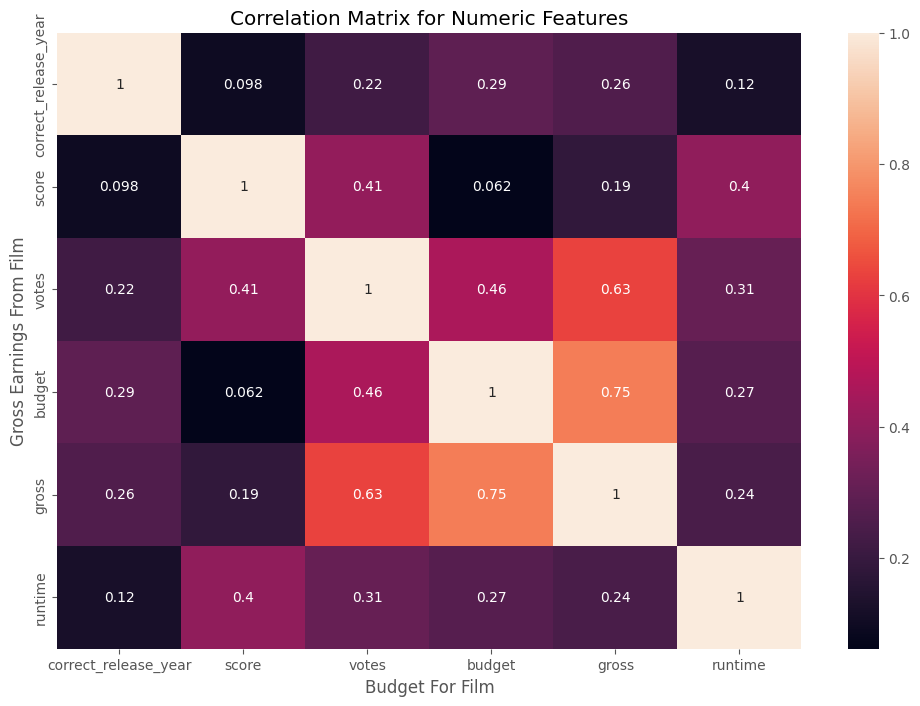

In [74]:
sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Budget For Film')
plt.ylabel('Gross Earnings From Film')

plt.show()

In [76]:
# Creating a numeric representation for the string values in the column 'company'

df_numerized = df
for col_name in df_numerized.columns:
  if(df_numerized[col_name].dtype == 'object'):
    df_numerized[col_name] = df_numerized[col_name].astype('category')
    df_numerized[col_name] = df_numerized[col_name].cat.codes


df_numerized

,name,rating,genre,correct_release_year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correct_release_month
0,6587,6,6,1980,1705,8.4,927000.0,2589,4014,1047,54,19000000,46998772,2319,146.0,14
1,5573,6,1,1980,1492,5.8,65000.0,2269,1632,327,55,4500000,58853106,731,104.0,13
2,5142,4,0,1980,1771,8.7,1200000.0,1111,2567,1745,55,18000000,538375067,1540,124.0,14
3,286,4,4,1980,1492,7.7,221000.0,1301,2000,2246,55,3500000,83453539,1812,88.0,13
4,1027,6,4,1980,1543,7.3,108000.0,1054,521,410,55,6000000,39846344,1777,98.0,13
5,2109,6,10,1980,2502,6.4,123000.0,2528,4362,241,55,550000,39754601,1812,95.0,16
6,5574,6,0,1980,1771,7.9,188000.0,1412,838,1277,55,27000000,115229890,2281,133.0,14
7,4436,6,3,1980,699,8.2,330000.0,1829,1769,2240,55,18000000,23402427,631,129.0,10
8,5281,4,0,1980,1753,6.8,101000.0,2306,1979,877,55,54000000,108185706,883,127.0,14
9,6213,6,3,1980,2286,7.0,10000.0,2864,423,589,55,10000000,15795189,2272,100.0,16


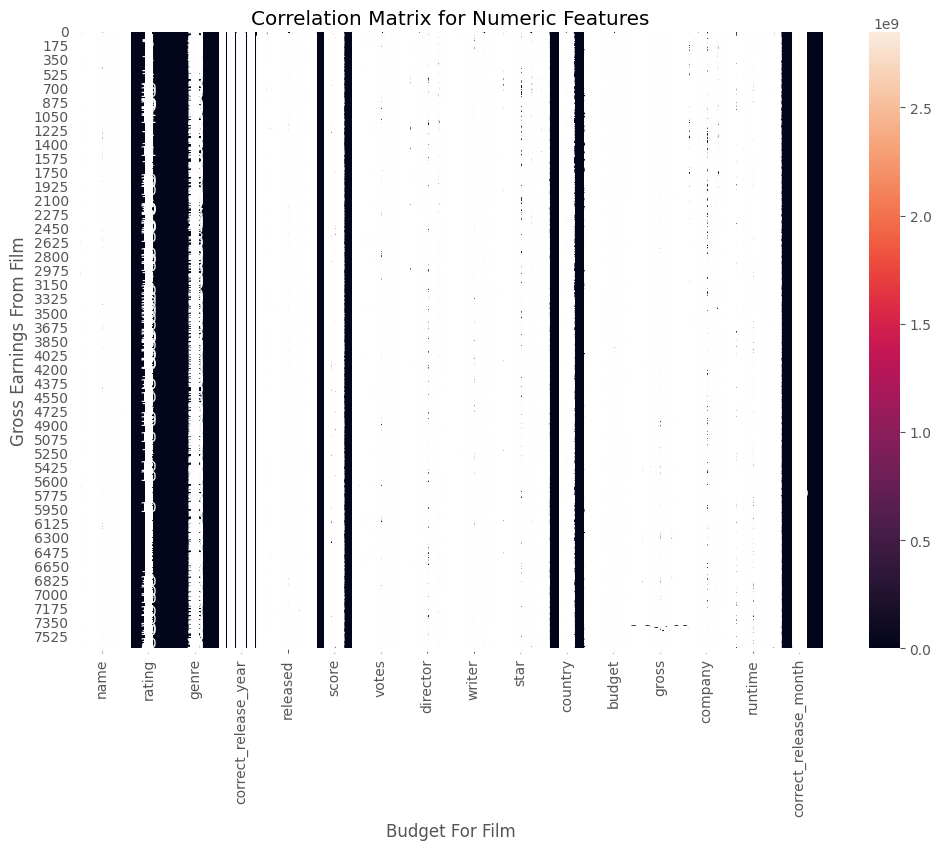

In [78]:
sns.heatmap(df_numerized, annot=True)

plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Budget For Film')
plt.ylabel('Gross Earnings From Film')

plt.show()

We initially tried to create a heatmap directly from the DataFrame (df_numerized), which resulted in a messy plot because heatmaps are meant to visualize relationships like correlations between variables. The correction involved calculating the correlation matrix of the numerized DataFrame first, and then using that matrix to generate the heatmap, which properly shows the correlations between all features...

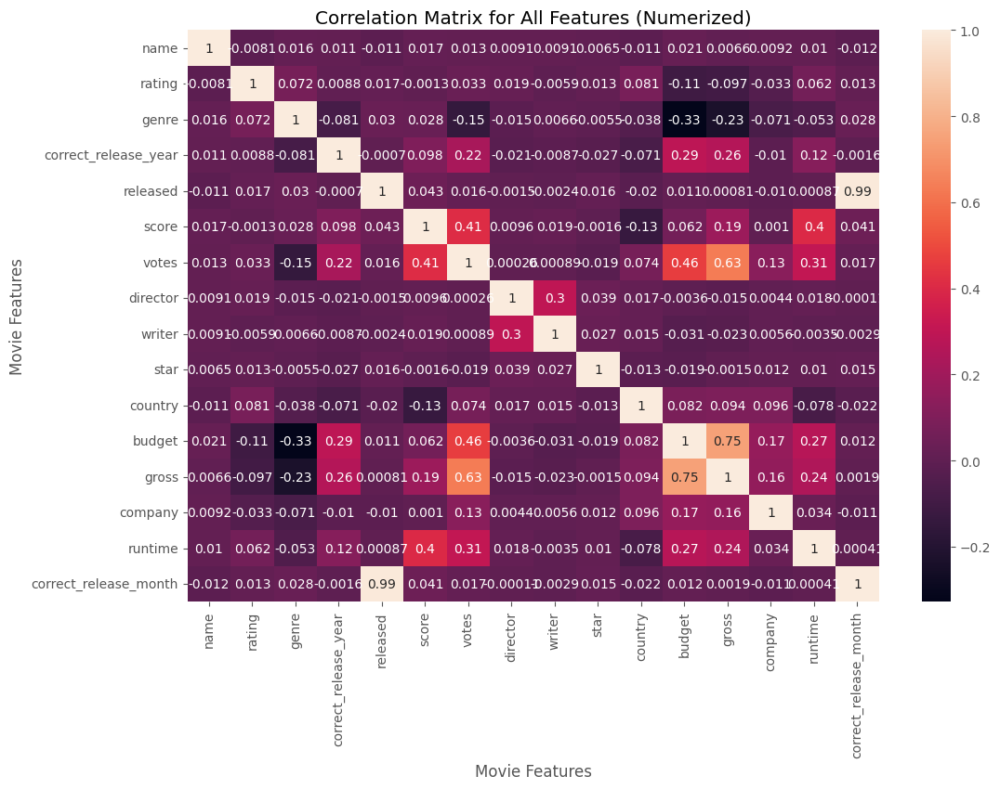

In [79]:
# Calculating the correlation matrix for the numerized DataFrame
correlation_matrix_numerized = df_numerized.corr()


sns.heatmap(correlation_matrix_numerized, annot=True)

plt.title('Correlation Matrix for All Features (Numerized)')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')

plt.show()

In [80]:
df_numerized.corr()

,name,rating,genre,correct_release_year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correct_release_month
name,1.000000,-0.008069,0.016355,0.011453,-0.011311,0.017097,0.013088,0.009079,0.009081,0.006472,-0.010737,0.020921,0.006601,0.009211,0.010392,-0.011725
rating,-0.008069,1.000000,0.072423,0.008779,0.016613,-0.001314,0.033225,0.019483,-0.005921,0.013405,0.081244,-0.108776,-0.097213,-0.032943,0.062145,0.013475
genre,0.016355,0.072423,1.000000,-0.081261,0.029822,0.027965,-0.145307,-0.015258,0.006567,-0.005477,-0.037615,-0.328484,-0.233385,-0.071067,-0.052711,0.028397
correct_release_year,0.011453,0.008779,-0.081261,1.000000,-0.000695,0.097995,0.222945,-0.020795,-0.008656,-0.027242,-0.070938,0.291690,0.259504,-0.010431,0.120811,-0.001562
released,-0.011311,0.016613,0.029822,-0.000695,1.000000,0.042788,0.016097,-0.001478,-0.002404,0.015777,-0.020427,0.011120,0.000806,-0.010474,0.000868,0.993694
score,0.017097,-0.001314,0.027965,0.097995,0.042788,1.000000,0.409182,0.009559,0.019416,-0.001609,-0.133348,0.061979,0.185583,0.001030,0.399451,0.040993
votes,0.013088,0.033225,-0.145307,0.222945,0.016097,0.409182,1.000000,0.000260,0.000892,-0.019282,0.073625,0.460932,0.632103,0.133204,0.309212,0.017337
director,0.009079,0.019483,-0.015258,-0.020795,-0.001478,0.009559,0.000260,1.000000,0.299067,0.039234,0.017490,-0.003584,-0.014758,0.004404,0.017624,-0.000105
writer,0.009081,-0.005921,0.006567,-0.008656,-0.002404,0.019416,0.000892,0.299067,1.000000,0.027245,0.015343,-0.030641,-0.023064,0.005646,-0.003511,-0.002892
star,0.006472,0.013405,-0.005477,-0.027242,0.015777,-0.001609,-0.019282,0.039234,0.027245,1.000000,-0.012998,-0.018534,-0.001529,0.012442,0.010174,0.015406


In [82]:
correlation_mat = df_numerized.corr() # calculating the corrleation matrix ('correlation_mat') for the 'df_numerized' dataframe which shows the correlation coefficency between all the numeric columns in the dataframe
corr_pairs = correlation_mat.unstack() # taking the 'correlation_mat' & 'unstack' into a pandas series 'corr_pairs'.  Unstacking transforms the matrix from a 2D structure into a 1D Series where the index is a MultiIndex consisting of pairs of column names & the values are the correlation coefficients for those pairs making it easier to work with and analyze all the correlation pairs individually.

corr_pairs

# Wanting to see the correlation coefficients between all pairs of features in your dataset after converting the categorical columns to numerical representations. Unstacking provides a convenient way to view and manipulate these correlation values.

name                   name                     1.000000
                       rating                  -0.008069
                       genre                    0.016355
                       correct_release_year     0.011453
                       released                -0.011311
                       score                    0.017097
                       votes                    0.013088
                       director                 0.009079
                       writer                   0.009081
                       star                     0.006472
                       country                 -0.010737
                       budget                   0.020921
                       gross                    0.006601
                       company                  0.009211
                       runtime                  0.010392
                       correct_release_month   -0.011725
rating                 name                    -0.008069
                       rating                   1.000000
                       genre                    0.072423
                       correct_release_year     0.008779
                       released                 0.016613
                       score                   -0.001314
                       votes                    0.033225
                       director                 0.019483
                       writer                  -0.005921
                       star                     0.013405
                       country                  0.081244
                       budget                  -0.108776
                       gross                   -0.097213
                       company                 -0.032943
                       runtime                  0.062145
                       correct_release_month    0.013475
genre                  name                     0.016355
                       rating                   0.072423
                       genre                    1.000000
                       correct_release_year    -0.081261
                       released                 0.029822
                       score                    0.027965
                       votes                   -0.145307
                       director                -0.015258
                       writer                   0.006567
                       star                    -0.005477
                       country                 -0.037615
                       budget                  -0.328484
                       gross                   -0.233385
                       company                 -0.071067
                       runtime                 -0.052711
                       correct_release_month    0.028397
correct_release_year   name                     0.011453
                       rating                   0.008779
                       genre                   -0.081261
                       correct_release_year     1.000000
                       released                -0.000695
                       score                    0.097995
                       votes                    0.222945
                       director                -0.020795
                       writer                  -0.008656
                       star                    -0.027242
                       country                 -0.070938
                       budget                   0.291690
                       gross                    0.259504
                       company                 -0.010431
                       runtime                  0.120811
                       correct_release_month   -0.001562
released               name                    -0.011311
                       rating                   0.016613
                       genre                    0.029822
                       correct_release_year    -0.000695
                       released                 1.000000
                       score                    0.042788
          

In [83]:
# Identifying the relationship between features, by sorting the correlation pairs from the most negative correlation to the most positive correlation & which pairs of features have the strongest negative linear relationships (values closer to -1), the weakest relationships (values closer to 0), and the strongest positive linear relationships (values closer to +1).
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

genre                  budget                  -0.328484
budget                 genre                   -0.328484
gross                  genre                   -0.233385
genre                  gross                   -0.233385
                       votes                   -0.145307
votes                  genre                   -0.145307
score                  country                 -0.133348
country                score                   -0.133348
budget                 rating                  -0.108776
rating                 budget                  -0.108776
                       gross                   -0.097213
gross                  rating                  -0.097213
correct_release_year   genre                   -0.081261
genre                  correct_release_year    -0.081261
runtime                country                 -0.078412
country                runtime                 -0.078412
company                genre                   -0.071067
genre                  company                 -0.071067
correct_release_year   country                 -0.070938
country                correct_release_year    -0.070938
runtime                genre                   -0.052711
genre                  runtime                 -0.052711
                       country                 -0.037615
country                genre                   -0.037615
company                rating                  -0.032943
rating                 company                 -0.032943
budget                 writer                  -0.030641
writer                 budget                  -0.030641
correct_release_year   star                    -0.027242
star                   correct_release_year    -0.027242
writer                 gross                   -0.023064
gross                  writer                  -0.023064
correct_release_month  country                 -0.022277
country                correct_release_month   -0.022277
director               correct_release_year    -0.020795
correct_release_year   director                -0.020795
country                released                -0.020427
released               country                 -0.020427
votes                  star                    -0.019282
star                   votes                   -0.019282
                       budget                  -0.018534
budget                 star                    -0.018534
genre                  director                -0.015258
director               genre                   -0.015258
gross                  director                -0.014758
director               gross                   -0.014758
star                   country                 -0.012998
country                star                    -0.012998
name                   correct_release_month   -0.011725
correct_release_month  name                    -0.011725
released               name                    -0.011311
name                   released                -0.011311
country                name                    -0.010737
name                   country                 -0.010737
company                correct_release_month   -0.010726
correct_release_month  company                 -0.010726
released               company                 -0.010474
company                released                -0.010474
                       correct_release_year    -0.010431
correct_release_year   company                 -0.010431
                       writer                  -0.008656
writer                 correct_release_year    -0.008656
name                   rating                  -0.008069
rating                 name                    -0.008069
writer                 rating                  -0.005921
rating                 writer                  -0.005921
genre                  star                    -0.005477
star                   genre                   -0.005477
budget                 director                -0.003584
director               budget                  -0.003584
runtime   

In [84]:
# Showing the pairs of features that have a correlation coefficient greater than 0.5.

high_corr = sorted_pairs[(sorted_pairs) > 0.5]

high_corr

,,0
gross,votes,0.632103
votes,gross,0.632103
gross,budget,0.745881
budget,gross,0.745881
released,correct_release_month,0.993694
correct_release_month,released,0.993694
director,director,1.000000
votes,votes,1.000000
released,released,1.000000
score,score,1.000000


# Conclusion

Looking at the output, you can see that 'gross' and 'budget' have a strong positive correlation (around 0.75), and 'gross' and 'votes' also have a moderately strong positive correlation (around 0.63). This suggests that movies with higher budgets and more votes tend to have higher gross earnings. The high correlation between 'released' and 'correct_release_month' is expected as one is derived from the other. The pairs with a correlation of 1.0 represent the correlation of a feature with itself, which is always a perfect positive correlation.